In [1]:
from pathlib import Path
from compare import ReferenceComparer, get_last_two_commits

# Find commits to compare

By default, the notebook compares last two commits(`ref1hash` is the older one and `ref2hash` is the newer one). You can customise this by changing the `ref1_hash` and `ref2_hash` variables or by providing `REF1_HASH` and `REF2_HASH` commit values. You can also provide custom spectrum paths for the two hashes with respect to the root directory for that commit. 

In [2]:
import os

ref1_hash = "7345bdc4fedc4b17cc096c361a2e3eda2929792d"
ref2_hash = "6b5197f330ecf83c39be35a3869ba70cc0e47fa3"

if not (ref1_hash and ref2_hash):
    ref1_hash, ref2_hash = get_last_two_commits()

if not (ref1_hash and ref2_hash):
    raise ValueError("Could not get commit hashes.")
    

if os.getenv('CUSTOM_REF1_SPECTRUM_PATH'):
    custom_ref1_spectrum_path = os.getenv('CUSTOM_REF1_SPECTRUM_PATH')
else:
    custom_ref1_spectrum_path = 'tardis/spectrum/tests/test_spectrum_solver/test_spectrum_solver/TestSpectrumSolver.h5'

if os.getenv('CUSTOM_REF2_SPECTRUM_PATH'):
    custom_ref2_spectrum_path = os.getenv('CUSTOM_REF2_SPECTRUM_PATH')
else:
    custom_ref2_spectrum_path = 'tardis/spectrum/tests/test_spectrum_solver/test_spectrum_solver/TestSpectrumSolver.h5'


In [3]:
ref1_hash, ref2_hash

('7345bdc4fedc4b17cc096c361a2e3eda2929792d',
 '6b5197f330ecf83c39be35a3869ba70cc0e47fa3')

# Example Values

Below are example values you can test the notebook with.

In [ ]:
# ref1_hash="170f1a2c0d8c6db518a4b9a0f4cb9b657aaa61b6"
# ref2_hash="d9fd3bb659d185bd9ece10b8e2175cf497ea84c5"
# custom_ref1_spectrum_path = 'tardis/spectrum/tests/test_spectrum_solver/test_spectrum_solver/TestSpectrumSolver.h5'
# custom_ref2_spectrum_path = 'test_spectrum_solver/test_spectrum_solver/TestSpectrumSolver.h5'

# Initialise the `ReferenceComparer` class


In [4]:
comparer = ReferenceComparer(ref1_hash=ref1_hash, ref2_hash=ref2_hash, print_path=True)
comparer.setup()
print(len(comparer.dcmp.left_only), len(comparer.dcmp.right_only))
comparer.diff_analyzer.display_diff_tree(comparer.dcmp)

Created temporary directory at /tmp/ref_compare_fou216p5
4 0
− .github/
− __init__.py
− compare.py
− compare_regression_data.ipynb
├ arepo_data/
├ atom_data/
│ ├ nlte_atom_data/
│ ├ stardis_atom_data/
├ tardis/
│ ├ plasma/
│ │ ├ equilibrium/
│ │ │ ├ tests/
│ │ │ │ ├ test_level_populations/
│ │ │ │ │ ├ test_level_population_solver/
│ │ │ │ ├ test_rate_matrix/
│ │ ├ tests/
│ │ │ ├ test_complete_plasmas/
│ │ │ │ ├ test_plasma/
│ │ │ ├ test_hdf_plasma/
│ │ │ ├ test_nlte_excitation/
│ │ │ ├ test_nlte_solver/
│ │ │ ├ test_plasma_continuum/
│ │ │ ├ test_tardis_model_density_config/
│ ├ simulation/
│ │ ├ tests/
│ │ │ ├ test_simulation/
│ ├ spectrum/
│ │ ├ tests/
│ │ │ ├ test_spectrum_solver/
│ │ │ │ ├ test_spectrum_solver/
│ ├ tests/
│ │ ├ test_tardis_full/
│ │ │ ├ test_transport_simple/
│ │ ├ test_tardis_full_formal_integral/
│ │ │ ├ test_transport_simple_formal_integral/
│ ├ transport/
│ │ ├ montecarlo/
│ │ │ ├ tests/
│ │ │ │ ├ test_continuum/
│ │ │ │ ├ test_montecarlo_main_loop/
│ │ │ │ ├ t

In [5]:
comparer.compare()

Error comparing item: /simulation/plasma/yg_interp
unsupported operand type(s) for -: 'PchipInterpolator' and 'PchipInterpolator'
Error comparing item: /simulation/plasma/determine_bf_macro_activation_idx
issubclass() arg 1 must be a class
Error comparing item: /simulation/plasma/determine_continuum_macro_activation_idx
too many values to unpack (expected 2)
Error comparing item: /simulation/plasma/get_current_bound_free_continua
issubclass() arg 1 must be a class

Summary for test_montecarlo_continuum.h5:
Total number of keys- in ref1: 150, in ref2: 150
Number of keys with different names in ref1 and ref2: 0
Number of keys with same name but different data in ref1 and ref2: 1
Number of totally same keys: 146

Error comparing item: /simulation/plasma/dilute_planckian_radiation_field
No module named 'tardis.plasma.radiation_field'


# Testing individual files

You can compare individual files too. Below example would work if you used example commits.

In [ ]:
# comparer.hdf_comparator.summarise_changes_hdf("test_generate_plot_ply__plotter_generate_plot_ply1__.h5",
#                                              Path(comparer.ref1_path) / "tardis/visualization/tools/tests/test_liv_plot/test_liv_plotter",
#                                              Path(comparer.ref2_path) / "tardis/visualization/tools/tests/test_liv_plot/test_liv_plotter"
#                                              )

# HDF File Comparison

Below graph visualises all the HDF files that changed. Each block represents a key that changed, hovering on that block would show relative percentage change for that key.

In [6]:
fig_same_name = comparer.generate_graph("different keys same name")
fig_different_keys = comparer.generate_graph("different keys")

Generating graph with updated hovertemplate
Generating graph with updated hovertemplate


In [7]:
fig_different_keys

In [8]:
fig_same_name.layout.width = 1000
fig_same_name

# Spectrum Comparison

You can compare TARDIS spectra for the two commits and also provide a custom path for the spectra.

/mnt/c/Users/admin/Desktop/tardis-regression-data/compare.py:319: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



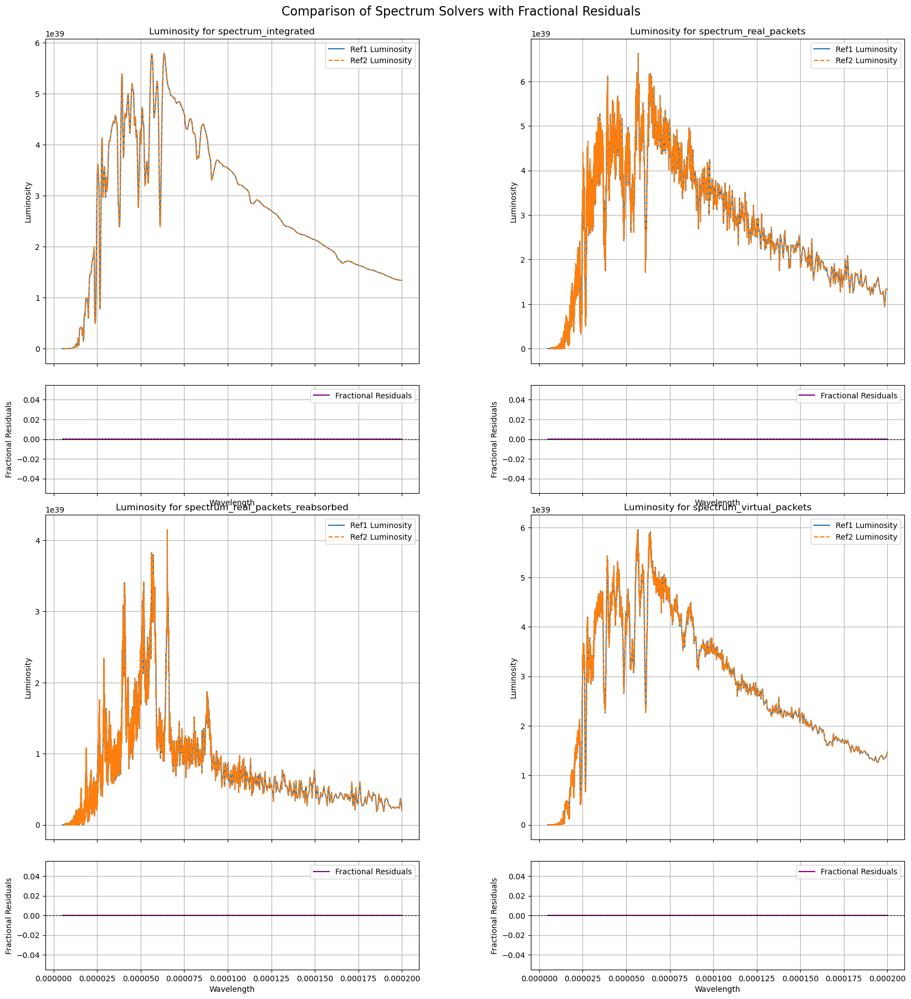

In [9]:
comparer.compare_testspectrumsolver_hdf(
    custom_ref1_path=Path(comparer.ref1_path) / custom_ref1_spectrum_path, 
    custom_ref2_path=Path(comparer.ref2_path) / custom_ref2_spectrum_path
)

In [ ]:
comparer.teardown()